In [ ]:
!pip install -q --upgrade ultralytics
!pip install -q --upgrade roboflow
!pip install -q --upgrade ipywidgets

In [1]:
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3" 

from kaggle_secrets import UserSecretsClient
import keras # 3.x
import matplotlib.pyplot as plt
import matplotlib.patches as p
import numpy as np
import pandas as pd
from PIL import Image
from roboflow import Roboflow
from sklearn.model_selection import train_test_split
from ultralytics import YOLO

In [2]:
# global constants
WORK_DIR = "/kaggle/working"

## Data Analysis

In [3]:
train_img_path = "/kaggle/input/airbus-aircrafts-sample-dataset/images"
train_annot_path = "/kaggle/input/airbus-aircrafts-sample-dataset/annotations.csv"
test_img_path = "/kaggle/input/airbus-aircrafts-sample-dataset/extras"

In [4]:
annotations_df = pd.read_csv(train_annot_path)
annotations_df.head()

,id,image_id,geometry,class
0,1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",Airplane
1,2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",Airplane
2,3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",Airplane
3,4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(813, 1518), (885, 1518), (885, 1604), (813, ...",Airplane
4,5,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(594, 938), (657, 938), (657, 1012), (594, 10...",Airplane


In [5]:
annotations_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3425 entries, 0 to 3424
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        3425 non-null   int64 
 1   image_id  3425 non-null   object
 2   geometry  3425 non-null   object
 3   class     3425 non-null   object
dtypes: int64(1), object(3)
memory usage: 107.2+ KB


## Data Preparation

In [6]:
# convert BB into XYXY format by selecting only 0-th and 2-nd tuple from a BB list of XY tuples; flatten into a list
annotations_df["geometry"] = annotations_df["geometry"].apply(eval)
annotations_df["xyxy"] = annotations_df['geometry'].apply(lambda x: [x[0][0], x[0][1], x[2][0], x[2][1]])
annotations_df

,id,image_id,geometry,class,xyxy
0,1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",Airplane,"[135, 522, 245, 600]"
1,2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",Airplane,"[1025, 284, 1125, 384]"
2,3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",Airplane,"[1058, 1503, 1130, 1568]"
3,4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(813, 1518), (885, 1518), (885, 1604), (813, ...",Airplane,"[813, 1518, 885, 1604]"
4,5,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(594, 938), (657, 938), (657, 1012), (594, 10...",Airplane,"[594, 938, 657, 1012]"
...,...,...,...,...,...
3420,3421,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1059, 393), (1187, 393), (1187, 522), (1059,...",Airplane,"[1059, 393, 1187, 522]"
3421,3422,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(932, 355), (1028, 355), (1028, 461), (932, 4...",Airplane,"[932, 355, 1028, 461]"
3422,3423,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(2461, 244), (2560, 244), (2560, 345), (2461,...",Truncated_airplane,"[2461, 244, 2560, 345]"
3423,3424,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[(1820, 344), (1937, 344), (1937, 443), (1820,...",Airplane,"[1820, 344, 1937, 443]"


In [7]:
# merge dataframe rows to have 1 image per row with all its BBs and class labels
grouped = annotations_df.groupby("image_id")[["xyxy", "class"]].agg(list).reset_index()
grouped

,image_id,xyxy,class
0,014de911-7810-4f7d-8967-3e5402209f4a.jpg,"[[2404, 35, 2493, 102], [2388, 114, 2475, 196]...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
1,0263270b-e3ee-41dc-aeef-43ff77e66d5b.jpg,"[[1962, 413, 2048, 482], [767, 306, 828, 360],...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
2,03f84930-e2be-4c19-9afc-0dc26d02538e.jpg,"[[1713, 968, 1813, 1087], [2077, 1175, 2138, 1...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
3,0641acc3-c0b9-4f9d-b0ba-7ad18aa08864.jpg,"[[171, 216, 242, 294], [406, 357, 472, 421], [...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
4,074737f4-7f59-4729-be5d-67f6f1d34668.jpg,"[[534, 5, 634, 76], [701, 89, 796, 202], [516,...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
...,...,...,...
98,f82d64a6-3bfa-4612-bcbd-847a7d89c296.jpg,"[[1379, 429, 1470, 531], [1627, 248, 1707, 345...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
99,fc06c595-7905-46c3-91c0-daf56af0f926.jpg,"[[1170, 157, 1289, 301], [1370, 402, 1495, 537...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
100,fc1ab8ce-e531-46ed-b74b-0374cd58cf2a.jpg,"[[1536, 687, 1654, 834], [1697, 760, 1790, 868...","[Airplane, Airplane, Airplane, Airplane, Airpl..."
101,fc8f9dc5-b6a2-49f3-9bde-1f8ff382ca5f.jpg,"[[1513, 123, 1664, 259], [2267, 214, 2329, 294...","[Airplane, Airplane, Airplane, Airplane, Airpl..."


In [8]:
# count number of BBs per image
grouped["n_bb"] = grouped["xyxy"].apply(lambda x: len([eval(str(bb)) for bb in x]))

In [9]:
grouped.describe()

,n_bb
count,103.000000
mean,33.252427
std,16.842825
min,5.000000
25%,23.000000
50%,30.000000
75%,39.500000
max,92.000000


Plot images with minimum and maximum number of bounding boxes.

In [10]:
# set class to id mapping and vice versa for visualization purposes
class_to_id = {"Airplane": 0, "Truncated_airplane": 1}
id_to_class = {0: "Airplane", 1: "Truncated_airplane"}

In [11]:
# utility function to plot n-th image along with its bounding boxes and class 
# labels given the DataFrame with all the necessary information
def visualize_example(df, n):
    filepath = os.path.join(train_img_path, df.loc[n, "image_id"])
    image = np.array(keras.utils.load_img(filepath))
    classes = np.array([cl for cl in df.loc[n, "class"]])
    bboxes = df.loc[n, "xyxy"]
    print(f"Image shape: {image.shape}")
    print(f"Number of bounding boxes: {len(bboxes)}")
    # plot image
    figure, ax = plt.subplots(1, 1, figsize=(10, 20))
    ax.imshow(image, cmap='gray')
    for i, bb in enumerate(bboxes):
        x1, y1, x2, y2 = bb
        rect = p.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='black', lw=2, facecolor='none')
        ax.add_patch(rect)
        ax.annotate(str(classes[i]), (x1, y1-10))
    plt.show()

Image shape: (2560, 2560, 3)
Number of bounding boxes: 92


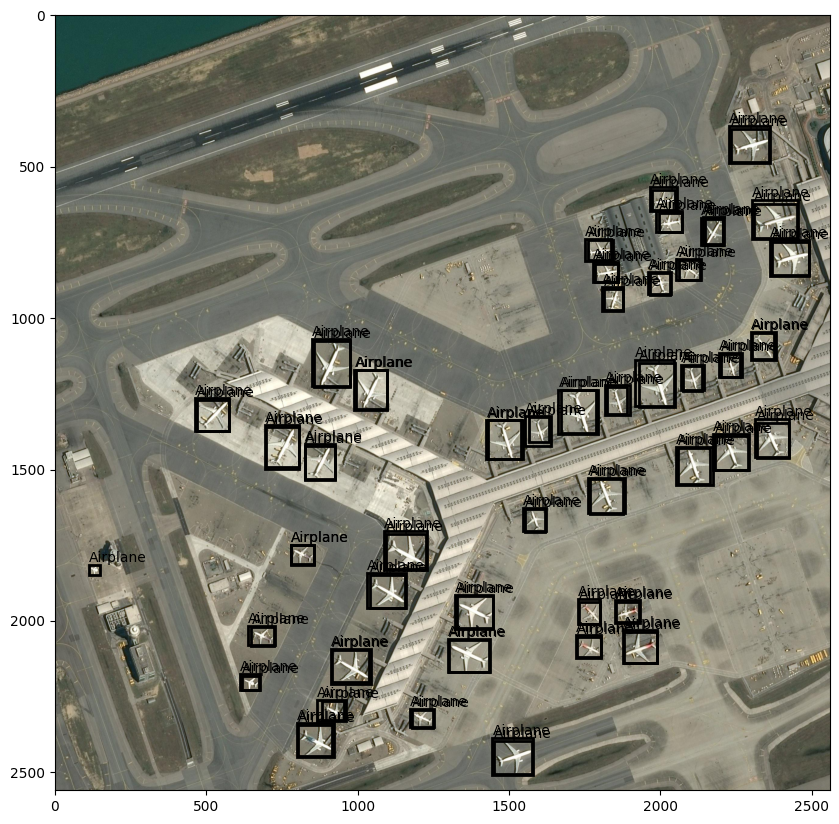

In [12]:
# image containing the maximum number of BBs
max_bb_id = grouped.loc[grouped["n_bb"] == 92].index.values[0]
visualize_example(grouped, max_bb_id)

Apparently, the image contains bounding boxes that overlap a lot, which might be a case for other images too. This problem can be addressed by removing bounding boxes with high IOU score.

In [13]:
# function to calculate IOU score between 2 BBs
def iou(bb1, bb2):
    # (x, y) coordinates of the intersection
    x1 = max(bb1[0], bb2[0])
    y1 = max(bb1[1], bb2[1])
    x2 = min(bb1[2], bb2[2])
    y2 = min(bb1[3], bb2[3])
    
    # intersection area of two bounding boxes
    inter_area = max(0, x2 - x1 + 1) * max(0, y2 - y1 + 1)
    # area of the first and the second bounding box
    bb1_area = max(0, bb1[2] - bb1[0] + 1) * max(0, bb1[3] - bb1[1] + 1)
    bb2_area = max(0, bb2[2] - bb2[0] + 1) * max(0, bb2[3] - bb2[1] + 1)
    
    # intersection over union
    return inter_area / float(bb1_area + bb2_area - inter_area)

In [14]:
# function that calculates BBs similarity based on their IOU, 
# if IOU score is < min threshold, BBs are considered non overlapping,
# otherwise from the 2 most similar BBs only one is picked
def similar_bb_ids(bbs, min_thresh):
    n = len(bbs)
    bb_id_pairs = []
    # pairwise BBs iou calculation
    for i in range(n):
        bb_scores = []
        for j in range(n):
            bb1, bb2 = bbs[i], bbs[j] 
            bb_scores.append(iou(bb1, bb2))
        # sort i-th BB iou scores in descending order, if the second iou score is 
        # less than the min threshold, BB has no significant overlap with any other 
        # BB except with itself (the first iou score)
        if (np.sort(bb_scores)[::-1][1] <= min_thresh):
            bb_id_pairs.append((i, i))
        # otherwise find a BB with the highest iou score as the most overlapping 
        else:
            max_score_id = np.argsort(bb_scores)[::-1][1]
            bb_id_pairs.append((i, max_score_id))
    return bb_id_pairs

In [15]:
def non_overlap_bbs(df, min_threshold=0.15, verbose=True):
    df_copy = df.copy()
    # loop through all the images in the dataframe
    for i, row in df_copy.iterrows():
        # for each BB of the i-th image get the most overlapping BB indices  
        bb_id_pairs = similar_bb_ids(row["xyxy"], min_threshold)
        # find non-overlapping BB indices
        nov_ids = [tuple(x)[1] for x in set(tuple(sorted(pair)) for pair in bb_id_pairs)]
        # select non-overlapping BBs
        nov_bbs = np.array(row["xyxy"])[nov_ids].tolist()
        # select corresponding class names
        nov_classes = np.array(row["class"])[nov_ids].tolist()
        # replace a row in DataFrame if number on BBs before and after similarity measuring is different
        if len(row["xyxy"]) != len(nov_bbs):
            if verbose:
                print(f"({i}) {row['image_id']}: {len(row['xyxy'])}/{len(nov_bbs)} (old/new)")
            df_copy.iloc[i] = pd.Series([row["image_id"], nov_bbs, nov_classes, len(nov_bbs)])
    return df_copy

In [16]:
# get updated DataFrame version with highly overlapping BBs removed
# show rows and the corresponding ids, where the BB update was performed;
# count number of BBs before and after an overlap check
grouped_up = non_overlap_bbs(grouped, min_threshold=0.15)

(10) 1e7e0450-6eb3-479e-88c2-990abc8207fa.jpg: 52/26 (old/new)
(23) 48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg: 35/18 (old/new)
(50) 7635d63c-6b97-4c9c-a7dc-27773d42ed4c.jpg: 60/30 (old/new)
(79) ca7b1077-0d37-4ada-9d56-0e66f864935e.jpg: 16/8 (old/new)
(85) d9399a45-6745-4e59-8903-90640b2ddf9f.jpg: 92/47 (old/new)
(86) dacabde6-c8a7-475b-ab26-81b4e4dd5977.jpg: 54/27 (old/new)
(100) fc1ab8ce-e531-46ed-b74b-0374cd58cf2a.jpg: 58/29 (old/new)


Image shape: (2560, 2560, 3)
Number of bounding boxes: 47


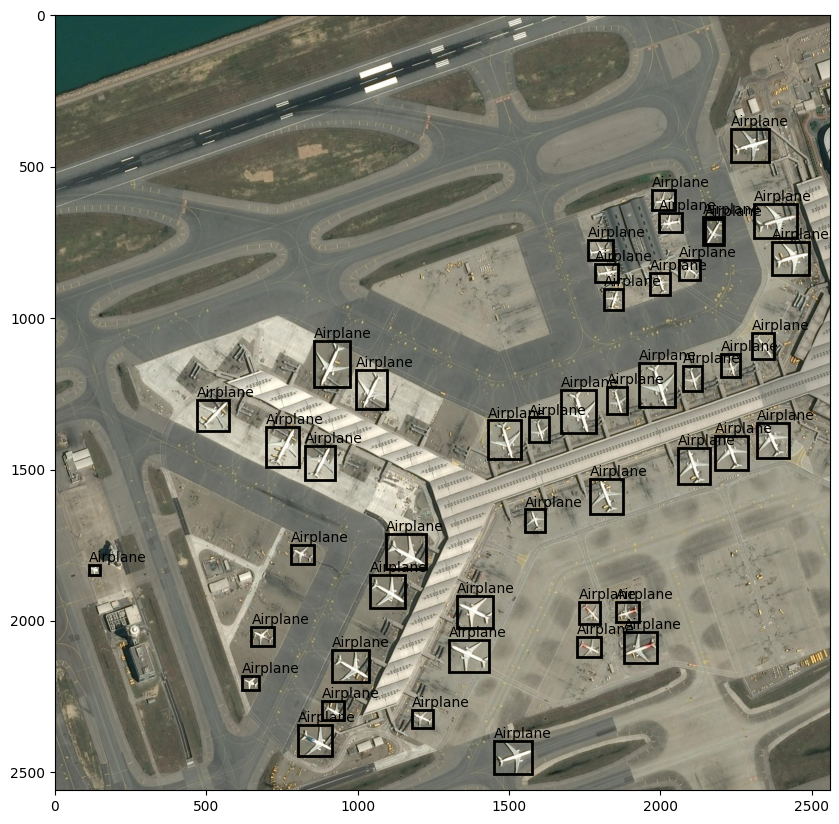

In [17]:
# visualize the same image with the updated BBs
visualize_example(grouped_up, max_bb_id)

### Training & Validation Split
In order to avoid data leakage later in the training process when training on image patches, we should split into training and validation subsets directly on images not on their patches. 

In [18]:
# split into train/valid
train, valid = train_test_split(grouped_up, test_size=0.1, random_state=42)

print(f"Training images count: {len(train)} \nValidation images count: {len(valid)}")

Training images count: 92 
Validation images count: 11


### Images & Labels Patching
1. Create image patches of size 512x512.
2. Transform bounding boxes from "xyxy" format to YOLO model bounding boxes format (normalized "x_center, y_center, height, width")
3. Save patches and bounding boxes in train/valid, images/labels subdirectories.
4. Create yaml configuration file.

In [19]:
# original image size
IMG_SIZE = 2560
# size of the image patches to create
PATCH_SIZE = 512
# overlap between the patches
STEP = 256

In [20]:
# transform dataset to have just one class label
class_to_id = {"Airplane": 0, "Truncated_airplane": 0}

train["class_id"] = train.loc[:, "class"].apply(lambda row: [class_to_id[item] for item in row])
valid["class_id"] = valid.loc[:, "class"].apply(lambda row: [class_to_id[item] for item in row])

train

,image_id,xyxy,class,n_bb,class_id
31,4fdabd34-a2fd-4f0a-bb48-01fe043f1499.jpg,"[[2526, 642, 2560, 723], [1857, 419, 1927, 499...","[Truncated_airplane, Airplane, Airplane, Airpl...",35,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
97,f34f05c6-84ce-47d7-ba5c-394d85c86a46.jpg,"[[1505, 233, 1587, 331], [960, 9, 1064, 121], ...","[Airplane, Airplane, Airplane, Airplane, Airpl...",25,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
85,d9399a45-6745-4e59-8903-90640b2ddf9f.jpg,"[[2148, 672, 2205, 754], [2200, 1119, 2263, 11...","[Airplane, Airplane, Airplane, Airplane, Airpl...",47,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
76,bfc53eb0-eb57-4dd7-8c1e-8e42ba49757b.jpg,"[[2309, 2125, 2351, 2191], [2459, 2022, 2522, ...","[Airplane, Airplane, Airplane, Airplane, Airpl...",35,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,074737f4-7f59-4729-be5d-67f6f1d34668.jpg,"[[534, 5, 634, 76], [701, 89, 796, 202], [516,...","[Airplane, Airplane, Airplane, Airplane, Airpl...",30,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
...,...,...,...,...,...
71,b6e9f8fc-3fbd-411a-a1e5-b853e8fbe2ac.jpg,"[[67, 146, 151, 224], [509, 413, 618, 526], [6...","[Airplane, Airplane, Airplane, Airplane, Airpl...",29,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
14,2314c1b5-ec8f-4212-b42f-43365a13fd20.jpg,"[[1748, 27, 1870, 178], [2057, 284, 2193, 434]...","[Airplane, Airplane, Truncated_airplane, Trunc...",20,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
92,ed921ec7-b950-460c-a912-12247d867fea.jpg,"[[2291, 455, 2391, 558], [2053, 506, 2148, 616...","[Airplane, Airplane, Airplane, Airplane, Airpl...",26,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
51,77f7b57f-5cf2-424d-a952-9847b3c3f35e.jpg,"[[2393, 41, 2478, 99], [2382, 125, 2462, 193],...","[Airplane, Airplane, Airplane, Airplane, Airpl...",31,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [21]:
# get patching grid to cut images
def get_grid(img_size, patch_size, step):
    # overlapping patches
    if step:
        n_steps = (img_size - patch_size) // step + 1
        x_coords = [(x * step, x * step + patch_size) for x in range(n_steps)]
        y_coords = [(y * step, y * step + patch_size) for y in range(n_steps)]
    # non-overlapping patches
    else: 
        n_steps = img_size // patch_size  # Calculate the number of steps to cover the image
        x_coords = [(x * patch_size, (x + 1) * patch_size) for x in range(n_steps)]
        y_coords = [(y * patch_size, (y + 1) * patch_size) for y in range(n_steps)]
    grid = [[(x[0], x[1]), (y[0], y[1])] for x in x_coords for y in y_coords]
    return grid
    
GRID = get_grid(IMG_SIZE, PATCH_SIZE, step=STEP)
N_PATCHES = len(GRID)
print(f"Number of {PATCH_SIZE}x{PATCH_SIZE} patches from {IMG_SIZE}x{IMG_SIZE} image: {N_PATCHES}")

Number of 512x512 patches from 2560x2560 image: 81


In [22]:
# cuts image patch BBs using grid coordinates, discards patched BBs with area lower than minimum 
# area (computed relative to the original BB area), returns image BBs and their class labels 
def cut_bounding_boxes(bounding_boxes, grid_coord, classes, min_area_proportion):
    (y1, y2), (x1, x2) = grid_coord
    patch_bboxes = []
    patch_classes = []
    for bb_coords, bb_class in zip(bounding_boxes, classes):
        bx1, by1, bx2, by2 = bb_coords    
        # check if any corner of the bounding box is within the patch
        cond_h = (x1<bx1<x2 or x1<bx2<x2 or bx1<x1<bx2 or bx1<x2<bx2)
        cond_w = (y1<by1<y2 or y1<by2<y2 or by1<y1<by2 or by1<y2<by2)
        if cond_h and cond_w: 
            # determine the starting corner
            start_x = max(x1, bx1)
            start_y = max(y1, by1)
            # calculate the adjusted bounding box coordinates relative to the patch
            new_bb = [start_x - x1, start_y - y1, min(bx2, x2) - x1, min(by2, y2) - y1]
            orig_bb_area = (bx2 - bx1 + 1) * (by2 - by1 + 1)
            new_bb_area = (new_bb[2] - new_bb[0] + 1) * (new_bb[3] - new_bb[1] + 1)
            if (new_bb_area / orig_bb_area) >= min_area_proportion:
                patch_bboxes.append(new_bb)
                patch_classes.append(bb_class)
            else:
                continue
    return patch_bboxes, patch_classes


# patch image, BBs, class names
def patch_image_bbox(image, bboxes, classes, grid=GRID, patch_size=PATCH_SIZE, min_area_proportion=0.6):
    n_patches = len(grid)
    patches = np.zeros((n_patches, patch_size, patch_size, 3))
    image_bboxes = []
    bb_classes = []
    # loop over grid coordinates
    for i, (x, y) in enumerate(grid):
        # get i-th image patch
        patch = image[:, x[0]:x[1], y[0]:y[1]]
        patches[i] = patch
        # calculate bounding boxes for i-th patch
        bbs, bb_cls = cut_bounding_boxes(bboxes, [x, y], classes, min_area_proportion=min_area_proportion)
        image_bboxes.append(bbs)
        bb_classes.append(bb_cls)
    return patches, image_bboxes, bb_classes

In [23]:
# Assuming 'PATCH_SIZE', 'image', 'bboxes', and 'grid' are already defined
# test patching function for a single image from training set
filepath = os.path.join(train_img_path, train.loc[max_bb_id, "image_id"])
image = keras.utils.load_img(filepath)
image = np.expand_dims(np.array(image), axis=0)
b_boxes = np.array(train.loc[max_bb_id, "xyxy"])
classes = train.loc[max_bb_id, "class"]
patches, patches_bboxes, patches_classes = patch_image_bbox(image, b_boxes, classes)

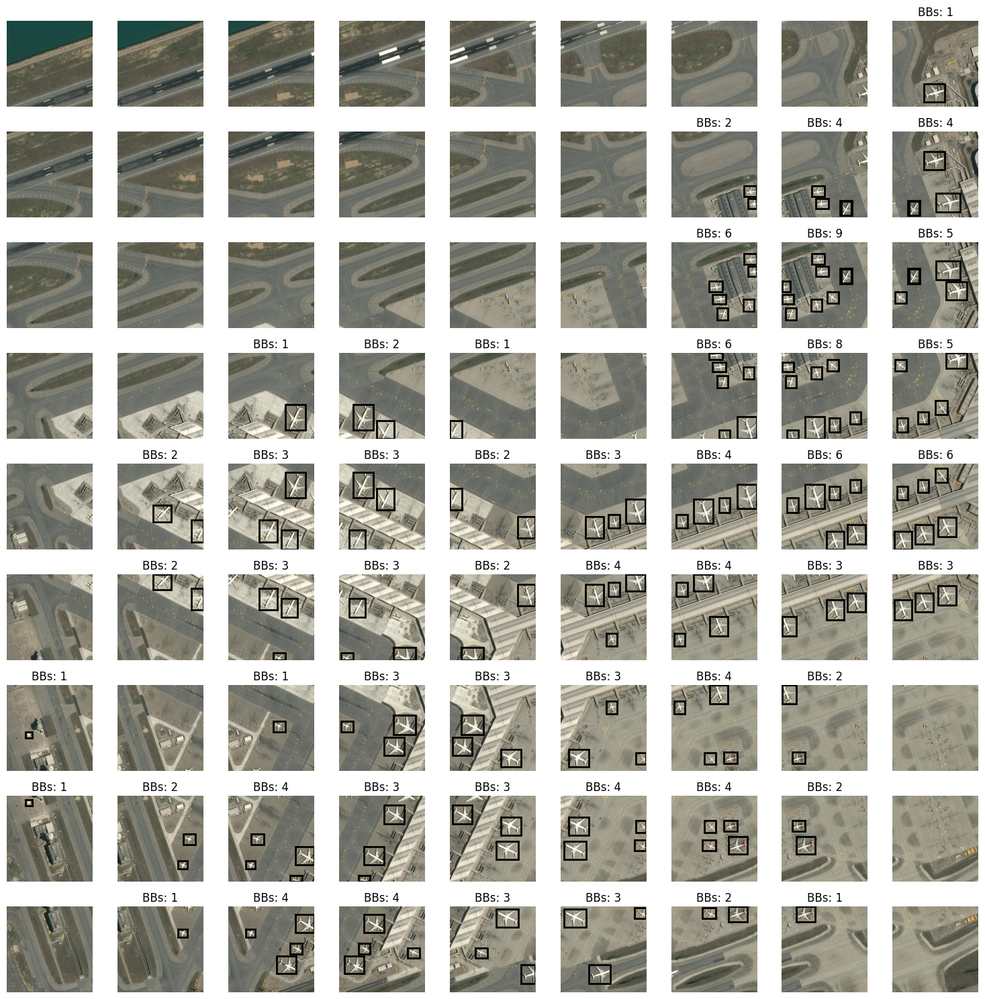

In [24]:
# visualization of image patching
num_rows, num_cols = 9, 9
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

for i in range(num_rows):
    for j in range(num_cols):
        index = i * num_cols + j
        axes[i, j].imshow(patches[index]/255., cmap='gray')
        axes[i, j].axis('off')
        if len(patches_bboxes[index]) > 0:
            for bboxes in patches_bboxes[index]:
                x1, y1, x2, y2 = bboxes
                rect = p.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='black', lw=2, facecolor='none')
                axes[i, j].add_patch(rect)
                axes[i, j].set_title(f"BBs: {len(patches_bboxes[index])}")
plt.tight_layout()
plt.show()

**Training and validation images patching**

In [25]:
# utility function to convert BB format from "xyxy" to normalized "x_center, y_center, height, width"
def xyxy2norm_cxywh(coords, image_shape):
    xnorm, ynorm = image_shape[0], image_shape[1]
    xmin, ymin, xmax, ymax = coords
    h, w = xmax - xmin, ymax - ymin
    xc, yc = xmin + (h / 2), ymin + (w / 2)
    return xc / xnorm, yc / ynorm, h / xnorm, w / ynorm

# test function on full size image
bb_test = valid.loc[0, "xyxy"][0]
xyxy2norm_cxywh(bb_test, [IMG_SIZE, IMG_SIZE, 3]) 

(0.9564453125, 0.0267578125, 0.034765625, 0.026171875)

In [26]:
# patch images, cut bounding boxes, save patches and resulting BBs to subdirectories
def prepare_data(df, img_dir, split_name, class_mapping=class_to_id, n_patches=N_PATCHES):
    # Create subdirectories for images and labels within each data split
    patches_path = os.path.join(split_name, "images")
    labels_path = os.path.join(split_name, "labels")
    if not os.path.exists(split_name):
        os.mkdir(split_name)
        os.mkdir(patches_path)
        os.mkdir(labels_path)
        
    images_paths = []
    labels_paths = []
    # loop through each image in DataFrame   
    for i, row in df.iterrows():
        image_id = row["image_id"]
        image_bbs = row["xyxy"]
        image_class_ids = row["class_id"]
        
        # load image 
        path = os.path.join(img_dir, image_id)
        image = keras.utils.load_img(path)
        image = np.expand_dims(np.array(image), axis=0)
        
        # patch image and its bounding boxes
        patches, patches_bboxes, patches_classes = patch_image_bbox(image, image_bbs, image_class_ids)
        image_name, image_ext = image_id.split(".")

        # paths to image patches
        patch_ids_paths = [os.path.join(patches_path, image_name + f"_{index}." + image_ext) for index in range(n_patches)]
        
        # save all the pathes paths
        images_paths.extend(patch_ids_paths)
        
        # save patched images and BBs
        for patch_idx, patch_id_path in enumerate(patch_ids_paths):
            img = Image.fromarray(patches[patch_idx].astype(np.uint8))
            img.save(patch_id_path)
            
            # if image contains objects to detect a file with labels is created 
            if len(patches_classes[patch_idx]) > 0:
                # create labels file path
                patch_labels_path = os.path.join(labels_path, image_name + f"_{patch_idx}." + "txt")
                # save a path to the file containing labels
                labels_paths.append(patch_labels_path)
                # write class id and BBs to the file
                with open(patch_labels_path, "w+") as f:
                    for bbs_idx, bbs in enumerate(patches_bboxes[patch_idx]):
                        # convert BBs format into YOLO supported BBs format
                        bbs = xyxy2norm_cxywh(bbs, [PATCH_SIZE, PATCH_SIZE, 3])
                        # extract bb class label
                        cls_label = str(patches_classes[patch_idx][bbs_idx])
                        # write class label + BBs to the text file
                        f.write(cls_label + " " + " ".join(str(bb) for bb in bbs) + "\n")
            # if there are no BBs for a given patch add "0" to match the length of images_paths
            else:
                labels_paths.append(0)
                    
    return images_paths, labels_paths

In [28]:
# create training images and labels
_, _ = prepare_data(df=train, img_dir=train_img_path, split_name="train")

# create validation images and labels
_, _ = prepare_data(df=valid, img_dir=train_img_path, split_name="valid")

In [29]:
user_secrets = UserSecretsClient()
roboflow_api_key = user_secrets.get_secret("roboflow_api_key")

rf = Roboflow(api_key=roboflow_api_key)
project = rf.workspace("aircraftobjectdetection").project("airbus_aircraft")
version = project.version(2)
dataset = version.download("yolov8-obb")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Airbus_Aircraft-2 in yolov8-obb:: 100%|██████████| 18/18 [00:00<00:00, 1402.49it/s]


In [30]:
# YOLO yaml data configuration file
CONFIG = f"""
names: ["Airplane"]

nc: 1

train: "/kaggle/working/train"
val: "/kaggle/working/valid"
test: "/kaggle/working/Airbus_Aircraft-2/test"
"""

with open("data.yaml", "w") as f:
    f.write(CONFIG)

## Model Training
1. Train YOLO model.
2. Test trained model on unseen data.

In [31]:
!yolo checks

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


Ultralytics YOLOv8.2.32 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5689.6/8062.4 GB disk)

OS                  Linux-5.15.133+-x86_64-with-glibc2.31
Environment         Kaggle
Python              3.10.13
Install             pip
RAM                 31.36 GB
CPU                 Intel Xeon 2.00GHz
CUDA                12.1

matplotlib          ✅ 3.7.5>=3.3.0
opencv-python       ✅ 4.10.0.82>=4.6.0
pillow              ✅ 9.5.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.32.3>=2.23.0
scipy               ✅ 1.11.4>=1.4.1
torch               ✅ 2.1.2>=1.8.0
torchvision         ✅ 0.16.2>=0.9.0
tqdm                ✅ 4.66.4>=4.64.0
psutil              ✅ 5.9.7
py-cpuinfo          ✅ 9.0.0
pandas              ✅ 2.2.2>=1.1.4
seaborn             ✅ 0.12.2>=0.11.0
ultralytics-thop    ✅ 0.2.8>=0.2.5


In [32]:
# Build a YOLOv8s model from pretrained weight
model = YOLO('yolov8s.pt')

# Display model information 
model.info()

# Train the model setting image size to the size of the patches created 
results = model.train(data=os.path.join(WORK_DIR, "data.yaml"), cache=False, epochs=10, exist_ok=True, imgsz=PATCH_SIZE)

100%|██████████| 21.5M/21.5M [00:00<00:00, 159MB/s] 


YOLOv8s summary: 225 layers, 11166560 parameters, 0 gradients, 28.8 GFLOPs
Ultralytics YOLOv8.2.32 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_c

100%|██████████| 755k/755k [00:00<00:00, 14.8MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 68.9MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/train/labels... 3966 images, 3486 backgrounds, 0 corrupt: 100%|██████████| 7452/7452 [00:04<00:00, 1610.51it/s]


train: New cache created: /kaggle/working/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /kaggle/working/valid/labels... 489 images, 402 backgrounds, 0 corrupt: 100%|██████████| 891/891 [00:00<00:00, 1555.85it/s]

val: New cache created: /kaggle/working/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 512 train, 512 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.69G       1.28      1.158      1.272         16        512: 100%|██████████| 466/466 [01:22<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:06<00:00,  4.18it/s]

                   all        891       1210      0.902      0.903      0.945       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.63G      1.251     0.7693      1.274         10        512: 100%|██████████| 466/466 [01:19<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:05<00:00,  5.26it/s]

                   all        891       1210      0.934        0.9      0.932      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.62G      1.211     0.7156       1.24         18        512: 100%|██████████| 466/466 [01:18<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:05<00:00,  5.23it/s]

                   all        891       1210      0.952      0.915      0.959      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.62G      1.163     0.6553      1.213          8        512: 100%|██████████| 466/466 [01:17<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:05<00:00,  5.32it/s]

                   all        891       1210      0.935      0.944       0.97      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.59G      1.131     0.6127      1.194         13        512: 100%|██████████| 466/466 [01:18<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:05<00:00,  5.26it/s]

                   all        891       1210      0.947      0.923      0.965       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.62G      1.079      0.557      1.161          5        512: 100%|██████████| 466/466 [01:17<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:05<00:00,  5.41it/s]

                   all        891       1210      0.952      0.924       0.96      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.59G      1.029     0.5178      1.135         15        512: 100%|██████████| 466/466 [01:17<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:05<00:00,  5.40it/s]

                   all        891       1210      0.953      0.965      0.985      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.62G       1.01     0.4929      1.122         12        512: 100%|██████████| 466/466 [01:18<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:05<00:00,  5.39it/s]

                   all        891       1210      0.963      0.912      0.962      0.724



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.59G     0.9819     0.4711       1.11          4        512: 100%|██████████| 466/466 [01:17<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:05<00:00,  5.46it/s]

                   all        891       1210      0.947       0.98      0.989      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.62G     0.9451     0.4372       1.09          6        512: 100%|██████████| 466/466 [01:17<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:05<00:00,  5.48it/s]

                   all        891       1210      0.962      0.961      0.989      0.761



10 epochs completed in 0.238 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.32 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:06<00:00,  4.14it/s]


                   all        891       1210       0.96      0.963      0.989      0.761
Speed: 0.1ms preprocess, 2.9ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/train


lr/pg0,▃▆█▇▆▅▄▃▂▁
lr/pg1,▃▆█▇▆▅▄▃▂▁
lr/pg2,▃▆█▇▆▅▄▃▂▁
metrics/mAP50(B),▃▁▄▆▅▄▇▅██
metrics/mAP50-95(B),▁▁▄▅▅▆▇▅██
metrics/precision(B),▁▅▇▅▆▇▇█▆█
metrics/recall(B),▁▁▂▅▃▃▇▂█▇
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▇▇▆▅▄▃▂▂▁


**Model validation data results**

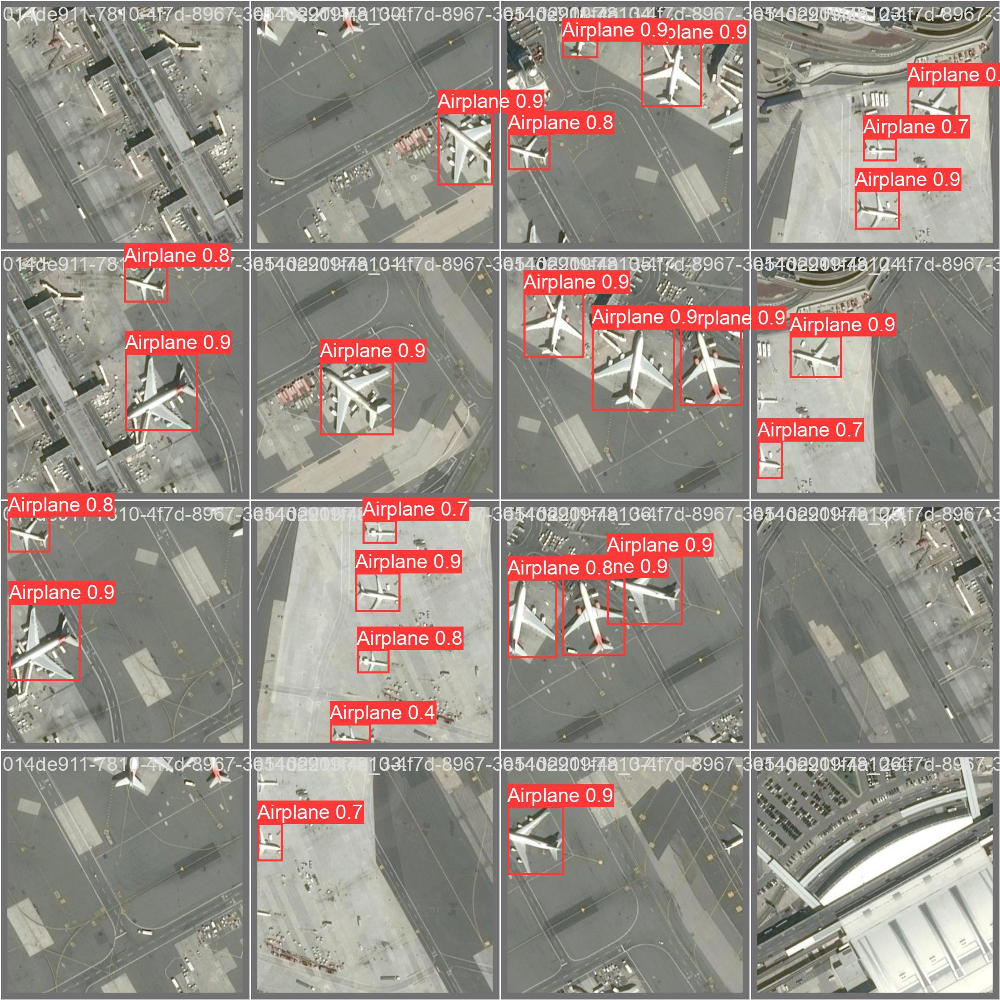

In [33]:
from IPython.display import Image

Image(filename=f"{WORK_DIR}/runs/detect/train/val_batch1_pred.jpg")

## Model Testing

In [34]:
# load best trained model
model_best = YOLO(f"{WORK_DIR}/runs/detect/train/weights/best.pt")

# evaluate model on the test images of full size
metrics = model_best.val(data=os.path.join(WORK_DIR, "data.yaml"), split="test", imgsz=IMG_SIZE)

# create predictions on test images for visualization
preds = model_best(f"{WORK_DIR}/Airbus_Aircraft-2/test/images", imgsz=IMG_SIZE, save=True, line_width=2)

Ultralytics YOLOv8.2.32 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /kaggle/working/Airbus_Aircraft-2/test/labels... 6 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6/6 [00:00<00:00, 575.71it/s]

val: New cache created: /kaggle/working/Airbus_Aircraft-2/test/labels.cache



os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


                   all          6        199      0.999      0.995      0.995       0.72
Speed: 3.4ms preprocess, 158.6ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/detect/val

image 1/6 /kaggle/working/Airbus_Aircraft-2/test/images/08a8132a-a6c7-4cab-adee-7e2976fd2822_jpg.rf.160e0f7757804c26943f3d60e452dc3b.jpg: 2560x2560 28 Airplanes, 130.3ms
image 2/6 /kaggle/working/Airbus_Aircraft-2/test/images/22bc9d20-02c4-4554-8fed-2c127d54b5ed_jpg.rf.8c268f2594a1eba4c78a0c98f4756b0d.jpg: 2560x2560 31 Airplanes, 128.8ms
image 3/6 /kaggle/working/Airbus_Aircraft-2/test/images/55aa185a-01c8-4668-ae87-1f1d67d15a08_jpg.rf.076e6a746f97839da97c3ce9cce6e135.jpg: 2560x2560 28 Airplanes, 129.6ms
image 4/6 /kaggle/working/Airbus_Aircraft-2/test/images/65825eef-f8a1-41b3-ac87-4a0a7d482a0e_jpg.rf.991b958df0c5bae20aa2f6b9eb781051.jpg: 2560x2560 20 Airplanes, 130.6ms
image 5/6 /kaggle/working/Airbus_Aircraft-2/test/images/defbf838-828b-4427-9bb7-9af33563ea9c_jpg.rf.797c062b42b03

In [59]:
# get a list of images with predictions
pred_img_paths = os.listdir(f"{WORK_DIR}/runs/detect/predict/")
pred_img_paths

['photo_2024-05-17_02-19-42_jpg.rf.762384b393b2648ee5a3484177149161.jpg',
 'defbf838-828b-4427-9bb7-9af33563ea9c_jpg.rf.797c062b42b035e691585705904beeff.jpg',
 '08a8132a-a6c7-4cab-adee-7e2976fd2822_jpg.rf.160e0f7757804c26943f3d60e452dc3b.jpg',
 '55aa185a-01c8-4668-ae87-1f1d67d15a08_jpg.rf.076e6a746f97839da97c3ce9cce6e135.jpg',
 '65825eef-f8a1-41b3-ac87-4a0a7d482a0e_jpg.rf.991b958df0c5bae20aa2f6b9eb781051.jpg',
 '22bc9d20-02c4-4554-8fed-2c127d54b5ed_jpg.rf.8c268f2594a1eba4c78a0c98f4756b0d.jpg']

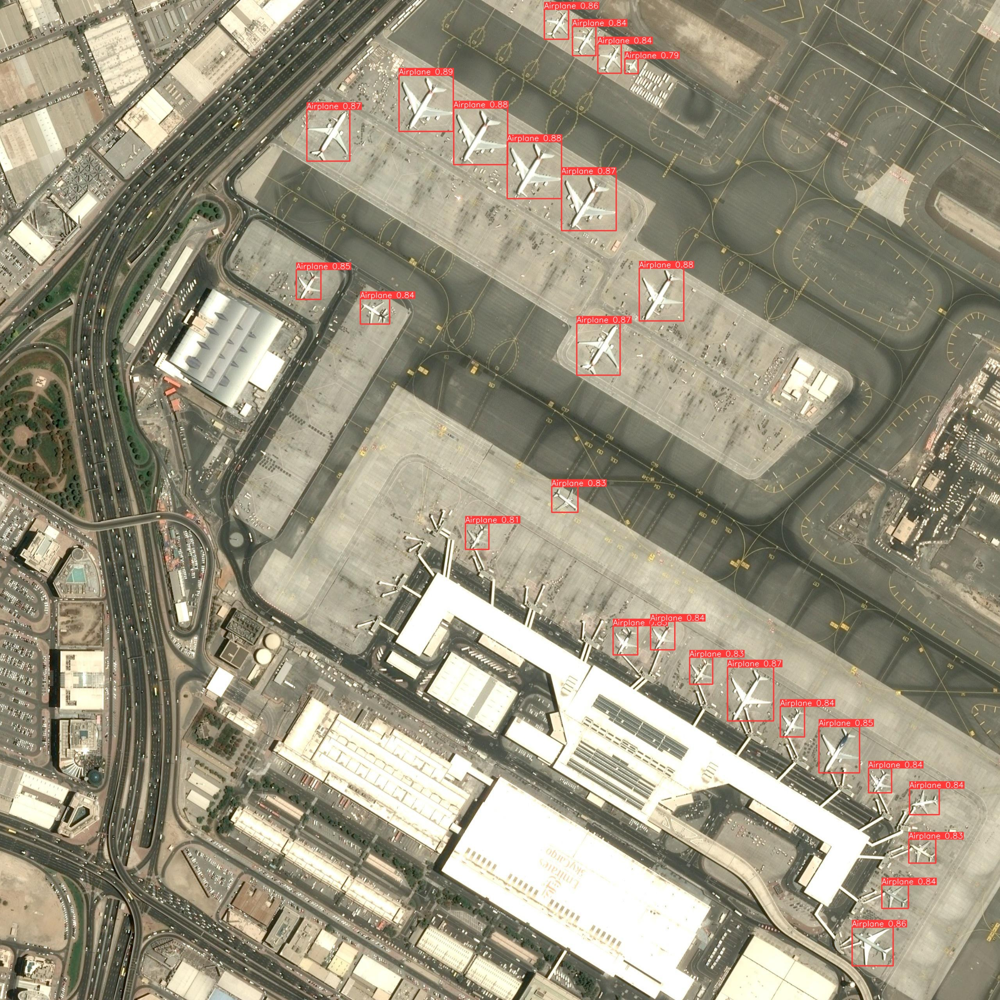

In [60]:
# plot prediction
Image(filename=f"{WORK_DIR}/runs/detect/predict/{pred_img_paths[0]}")

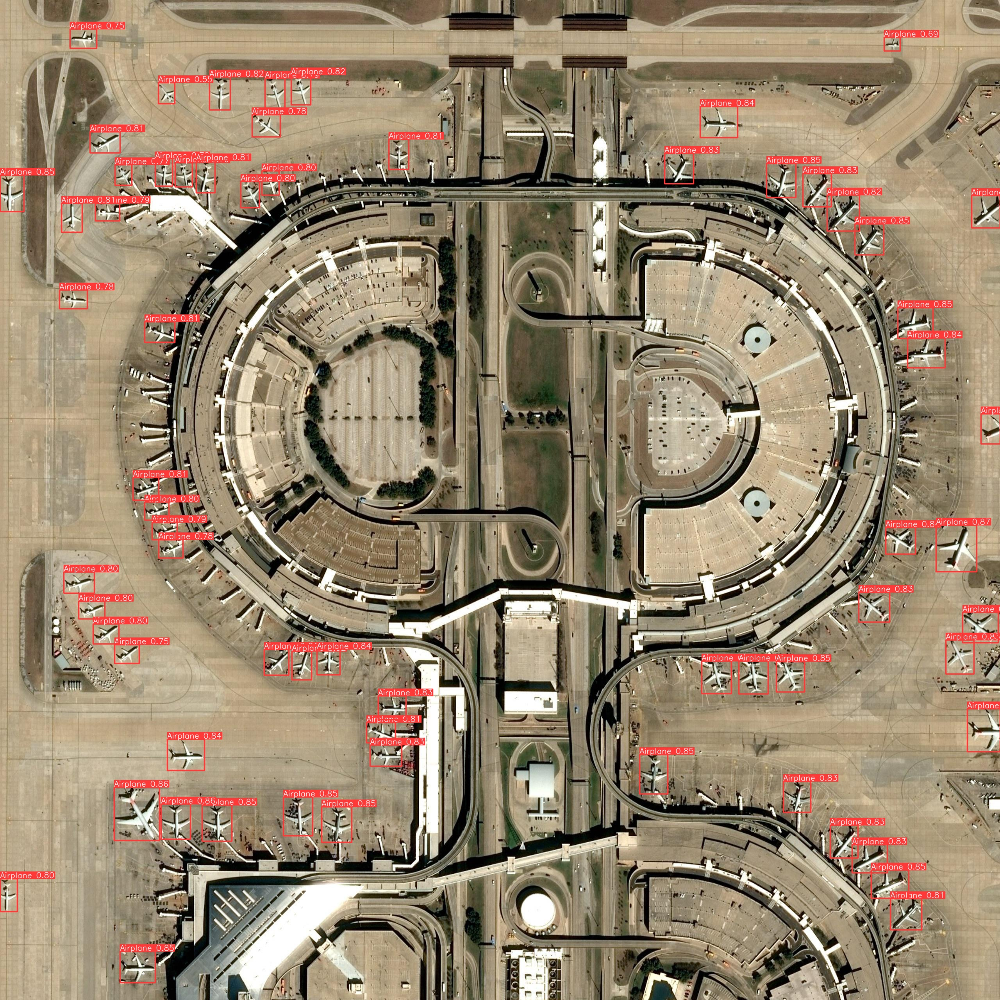

In [61]:
Image(filename=f"{WORK_DIR}/runs/detect/predict/{pred_img_paths[1]}")

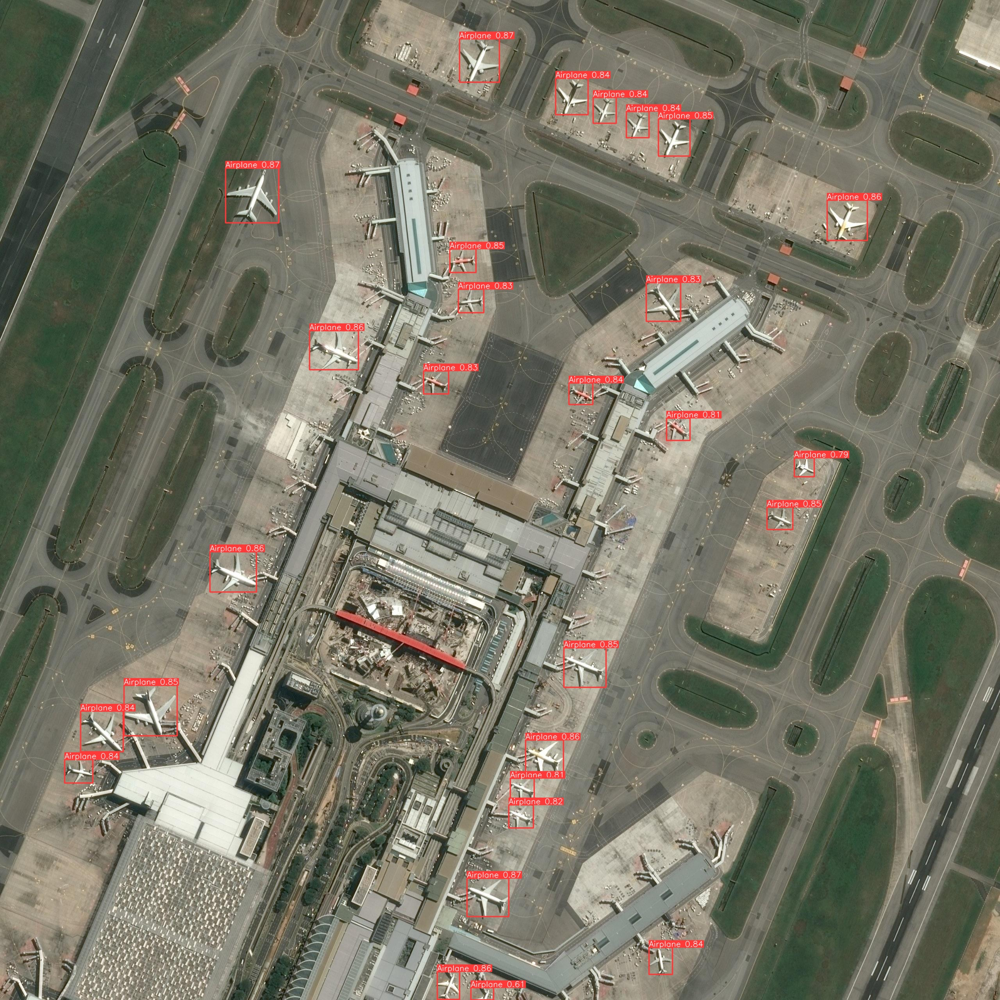

In [62]:
Image(filename=f"{WORK_DIR}/runs/detect/predict/{pred_img_paths[2]}")

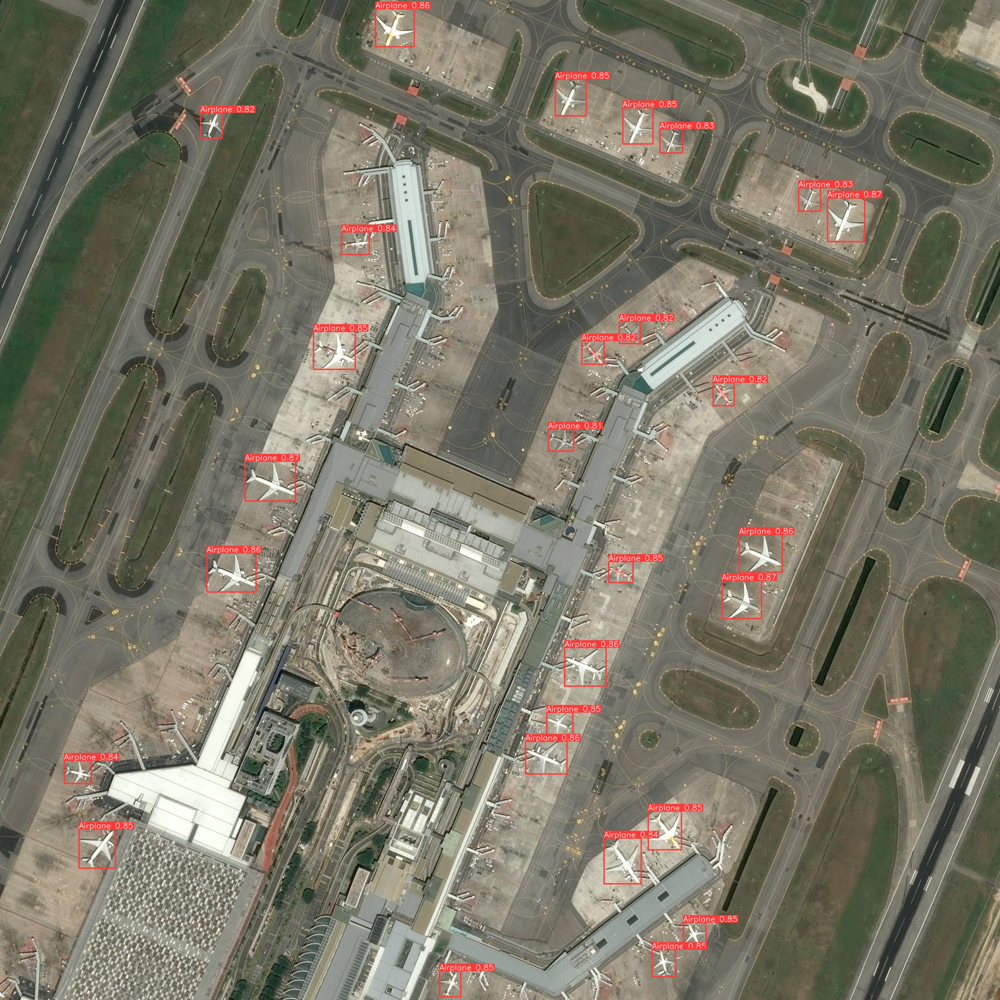

In [64]:
Image(filename=f"{WORK_DIR}/runs/detect/predict/{pred_img_paths[3]}")